<a href="https://colab.research.google.com/github/Nikhil5566/EDA-Repo/blob/main/A_Data_Driven_Study_of_Natural_Disaster_Events.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# A Data Driven Study of Natural Disaster Events

# About the dataset and Insights

*   **Temporal Patterns**: Time-series analysis revealed trends in disaster events, affected population, and economic loss over time, though specific trends (increasing/decreasing) would require direct observation of the generated plots.
*   **Geographical Distribution**: The analysis successfully identified and visualized the top 10 geographical hotspots based on both the frequency of disaster events and the total estimated economic loss. This highlights specific locations disproportionately affected by disasters.
*   **Disaster Type Impacts**: Different disaster types have varying average impacts on affected populations and estimated economic loss. The analysis calculated and visualized these average impacts, showing which disaster types are generally more costly or affect more people.
*   **Aid Effectiveness and Severity Level**:
    *   Comparisons of 'affected\_population', 'estimated\_economic\_loss\_usd', and 'response\_time\_hours' based on whether 'aid\_provided' was 'Yes' or 'No' were visualized, providing initial indications of how aid correlates with disaster outcomes.
    *   The distribution of 'severity\_level' was examined, and its correlation with 'affected\_population', 'estimated\_economic\_loss\_usd', 'response\_time\_hours', and 'infrastructure\_damage\_index' was quantified and visualized using a heatmap. This suggests how disaster severity relates to other impact metrics.

### Insights or Next Steps

*   Further investigate the specific disaster types and severity levels that disproportionately drive high affected populations and economic losses to inform targeted disaster preparedness and response strategies.
*   Delve deeper into the observed correlations between 'aid\_provided' and impact metrics. For example, if aid is provided to events with higher initial impacts, it suggests aid allocation is prioritized for more severe crises. Additional analysis could explore the effectiveness of aid in mitigating these impacts over time, potentially using a more sophisticated causal inference approach if suitable data is available.


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Installing Kaggle API
!pip install -q kaggle

# Uploading kaggle.json
from google.colab import files
files.upload()

# Moving kaggle.json to ~/.kaggle/
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Downloading the dataset using Kaggle API
!kaggle datasets download -d minahilfatima12328/a-data-driven-study-of-natural-disaster-events

# Unziping the downloaded file
!unzip a-data-driven-study-of-natural-disaster-events.zip

Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/minahilfatima12328/a-data-driven-study-of-natural-disaster-events
License(s): CC0-1.0
  0% 0.00/823k [00:00<?, ?B/s]
100% 823k/823k [00:00<00:00, 1.10GB/s]
Archive:  a-data-driven-study-of-natural-disaster-events.zip
  inflating: synthetic_disaster_events_2025.csv  


In [16]:
df['date'] = pd.to_datetime(df['date'])
df['year'] = df['date'].dt.year
df['month'] = df['date'].dt.month
df.head()

,event_id,disaster_type,location,latitude,longitude,date,severity_level,affected_population,estimated_economic_loss_usd,response_time_hours,aid_provided,infrastructure_damage_index,is_major_disaster,year,month
0,1,Wildfire,Chile,-34.681672,-71.819529,2025-08-27,8,31104,2768213.39,5.12,Yes,0.59,1,2025,8
1,2,Hurricane,India,22.128569,78.023951,2023-05-29,5,29340,5996226.87,44.43,No,0.26,0,2023,5
2,3,Volcanic Eruption,Italy,42.316058,11.031447,2023-01-15,7,34804,9222541.48,49.30,No,0.94,1,2023,1
3,4,Drought,Chile,-33.436253,-69.984615,2024-02-08,8,31191,1827703.09,65.56,Yes,0.94,1,2024,2
4,5,Volcanic Eruption,Turkey,39.400977,37.006822,2023-12-23,8,46284,13435921.49,60.96,No,0.92,1,2023,12


In [3]:
df  = pd.read_csv('synthetic_disaster_events_2025.csv')
df.head(11)

,event_id,disaster_type,location,latitude,longitude,date,severity_level,affected_population,estimated_economic_loss_usd,response_time_hours,aid_provided,infrastructure_damage_index,is_major_disaster
0,1,Wildfire,Chile,-34.681672,-71.819529,2025-08-27,8,31104,2768213.39,5.12,Yes,0.59,1
1,2,Hurricane,India,22.128569,78.023951,2023-05-29,5,29340,5996226.87,44.43,No,0.26,0
2,3,Volcanic Eruption,Italy,42.316058,11.031447,2023-01-15,7,34804,9222541.48,49.30,No,0.94,1
3,4,Drought,Chile,-33.436253,-69.984615,2024-02-08,8,31191,1827703.09,65.56,Yes,0.94,1
4,5,Volcanic Eruption,Turkey,39.400977,37.006822,2023-12-23,8,46284,13435921.49,60.96,No,0.92,1
5,6,Wildfire,Indonesia,-2.476140,112.894649,2023-11-19,9,49656,11532694.98,55.76,Yes,0.95,1
6,7,Drought,India,19.975275,78.004552,2023-07-12,7,33514,7279586.44,48.28,Yes,0.40,1
7,8,Volcanic Eruption,Japan,37.140390,139.725145,2023-05-16,7,34713,6272056.18,31.36,Yes,1.00,1
8,9,Hurricane,Turkey,41.048683,34.174467,2025-10-24,4,8039,2296849.96,43.52,No,0.53,0
9,10,Drought,USA,34.125352,-96.170595,2025-04-03,4,20776,5232644.17,64.62,Yes,0.64,0


In [4]:
df.tail(11)

,event_id,disaster_type,location,latitude,longitude,date,severity_level,affected_population,estimated_economic_loss_usd,response_time_hours,aid_provided,infrastructure_damage_index,is_major_disaster
19989,19990,Drought,India,20.302944,78.419727,2023-08-19,7,40181,11806415.34,66.17,Yes,0.90,1
19990,19991,Earthquake,Chile,-34.728955,-71.980118,2024-06-21,4,18824,2342719.25,64.11,Yes,0.70,0
19991,19992,Drought,Philippines,14.484406,121.474884,2023-05-08,6,26834,5950918.84,32.30,No,0.34,0
19992,19993,Drought,India,18.804667,78.232830,2024-02-29,1,0,0.00,51.75,Yes,0.22,0
19993,19994,Wildfire,Chile,-33.721755,-70.728298,2024-04-01,1,2881,853725.52,51.21,Yes,0.35,0
19994,19995,Flood,India,17.831094,78.048140,2025-03-29,7,46371,4441763.55,35.69,Yes,0.69,1
19995,19996,Volcanic Eruption,India,19.962542,82.590546,2025-11-16,6,28135,2556182.54,38.71,No,0.69,0
19996,19997,Volcanic Eruption,Japan,35.853659,138.522874,2025-04-08,2,4340,1228534.00,7.67,No,0.18,0
19997,19998,Hurricane,Philippines,13.720136,121.306074,2025-08-26,8,44663,8518260.66,9.76,Yes,0.75,1
19998,19999,Volcanic Eruption,India,19.959071,77.272460,2023-03-24,7,37484,10802942.53,13.87,Yes,0.77,1


In [5]:
df.shape

(20000, 13)

In [6]:
df.columns

Index(['event_id', 'disaster_type', 'location', 'latitude', 'longitude',
       'date', 'severity_level', 'affected_population',
       'estimated_economic_loss_usd', 'response_time_hours', 'aid_provided',
       'infrastructure_damage_index', 'is_major_disaster'],
      dtype='object')

In [7]:
df.dtypes

,0
event_id,int64
disaster_type,object
location,object
latitude,float64
longitude,float64
date,object
severity_level,int64
affected_population,int64
estimated_economic_loss_usd,float64
response_time_hours,float64


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 13 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   event_id                     20000 non-null  int64  
 1   disaster_type                20000 non-null  object 
 2   location                     20000 non-null  object 
 3   latitude                     20000 non-null  float64
 4   longitude                    20000 non-null  float64
 5   date                         20000 non-null  object 
 6   severity_level               20000 non-null  int64  
 7   affected_population          20000 non-null  int64  
 8   estimated_economic_loss_usd  20000 non-null  float64
 9   response_time_hours          20000 non-null  float64
 10  aid_provided                 20000 non-null  object 
 11  infrastructure_damage_index  20000 non-null  float64
 12  is_major_disaster            20000 non-null  int64  
dtypes: float64(5), i

In [9]:
df.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
event_id,20000.0,NaN,NaN,NaN,10000.5,5773.647028,1.0,5000.75,10000.5,15000.25,20000.0
disaster_type,20000,7,Earthquake,2910,NaN,NaN,NaN,NaN,NaN,NaN,NaN
location,20000,8,India,2583,NaN,NaN,NaN,NaN,NaN,NaN,NaN
latitude,20000.0,NaN,NaN,NaN,18.749811,25.026759,-43.127383,3.560059,24.361006,38.285895,48.452161
longitude,20000.0,NaN,NaN,NaN,41.976629,82.535922,-102.133704,8.346726,74.600322,117.460836,145.902669
date,20000,1096,2024-12-12,34,NaN,NaN,NaN,NaN,NaN,NaN,NaN
severity_level,20000.0,NaN,NaN,NaN,5.4893,2.866269,1.0,3.0,5.0,8.0,10.0
affected_population,20000.0,NaN,NaN,NaN,27641.24895,16017.199074,0.0,14755.0,27612.5,40016.5,75147.0
estimated_economic_loss_usd,20000.0,NaN,NaN,NaN,4831072.645818,3624308.320998,0.0,2024090.015,4031417.535,7018268.19,21868934.78
response_time_hours,20000.0,NaN,NaN,NaN,36.369664,20.42057,1.0,18.4075,36.56,54.02,71.99


In [10]:
df.isnull().sum()

,0
event_id,0
disaster_type,0
location,0
latitude,0
longitude,0
date,0
severity_level,0
affected_population,0
estimated_economic_loss_usd,0
response_time_hours,0


In [11]:
df.duplicated().sum()

np.int64(0)

# Univariate Analysis

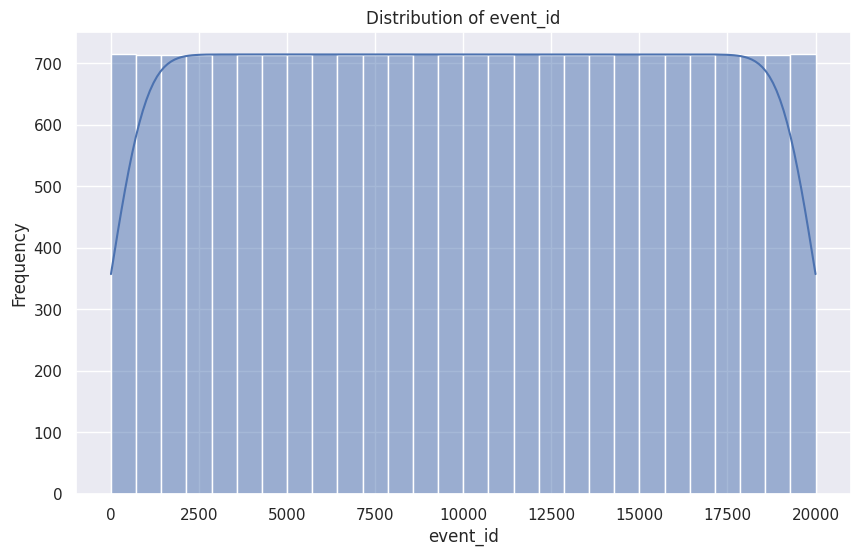

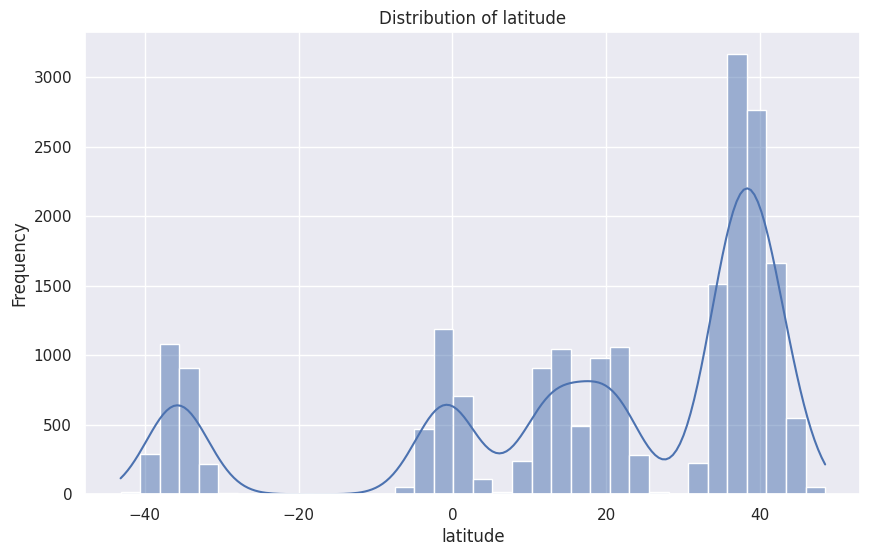

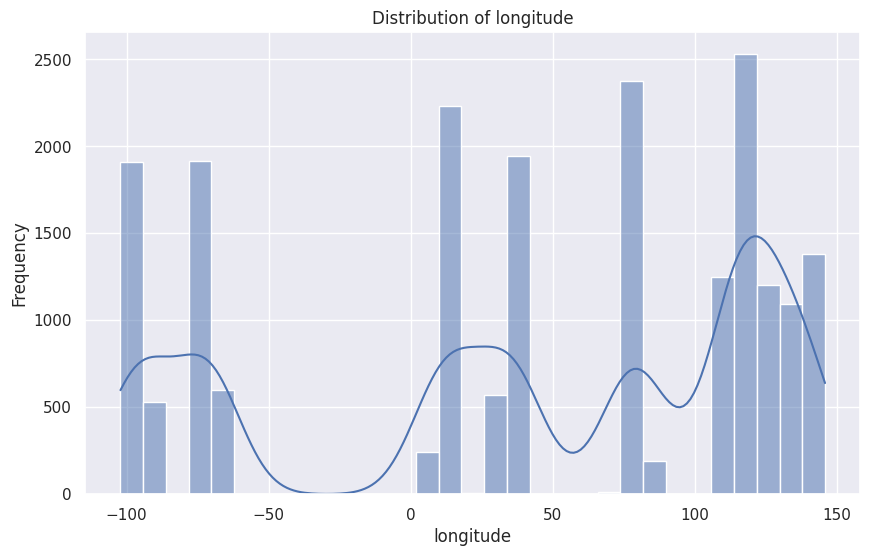

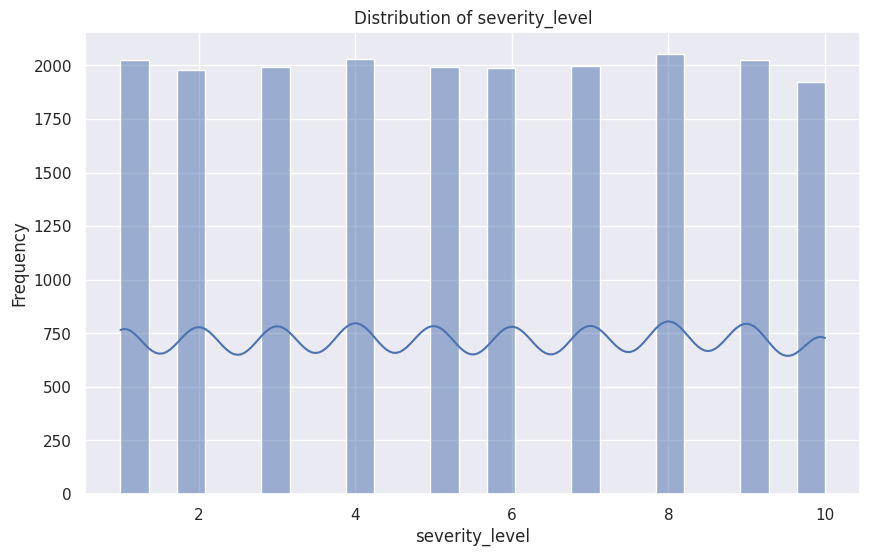

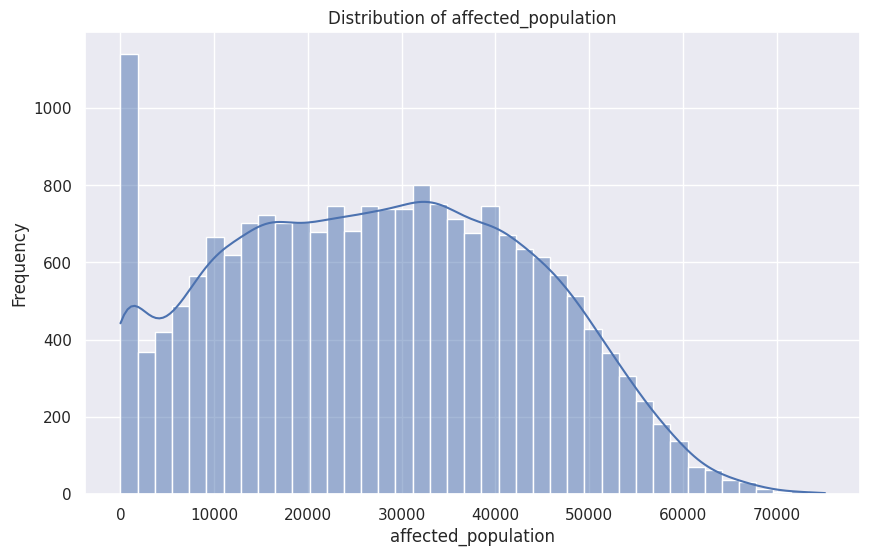

...

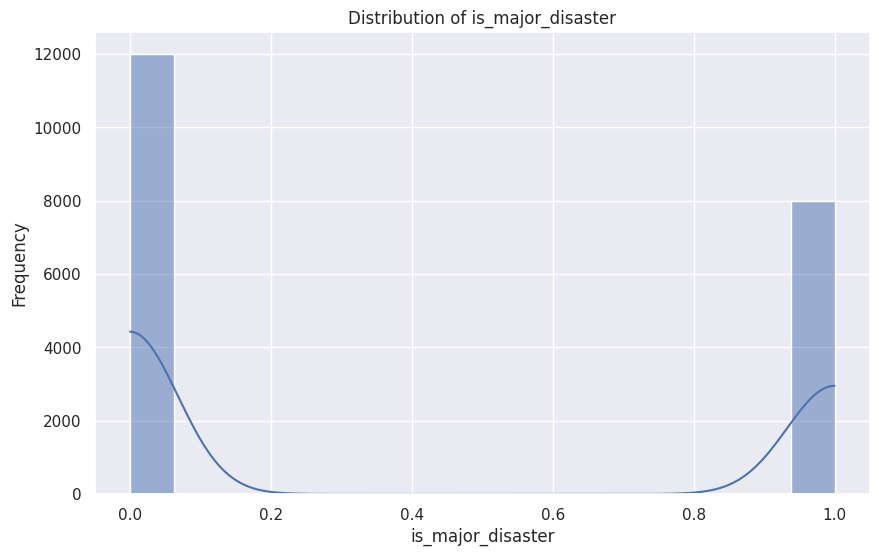

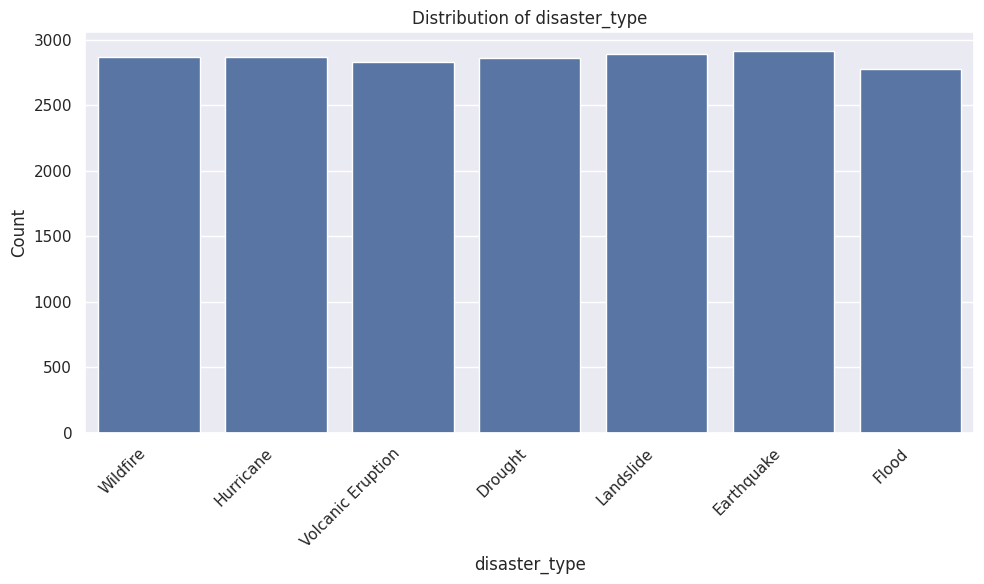

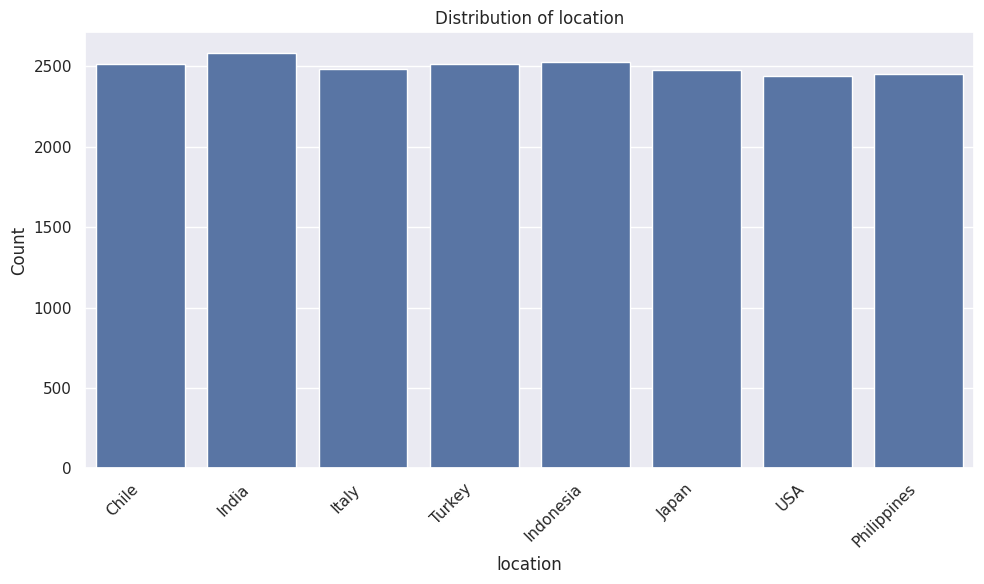

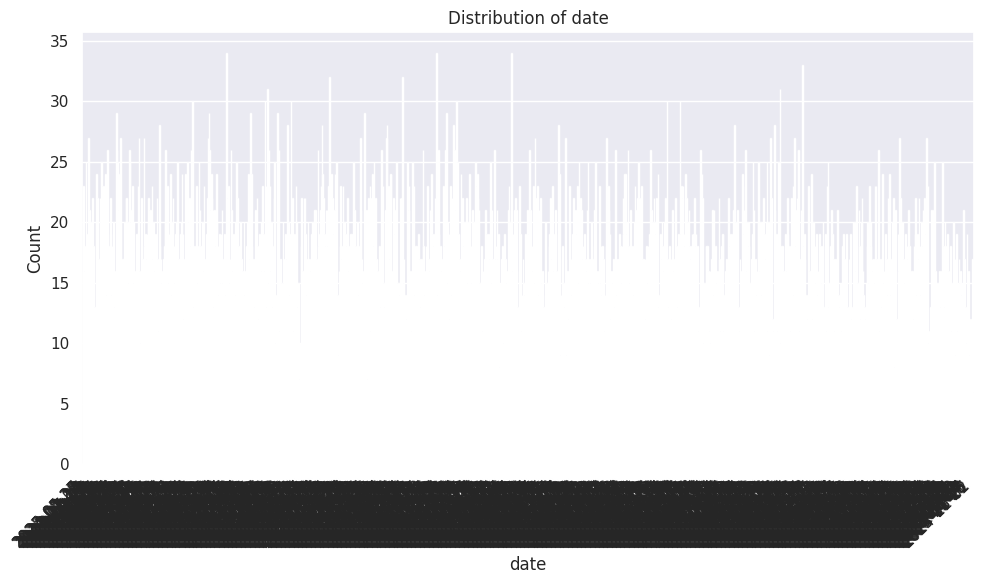

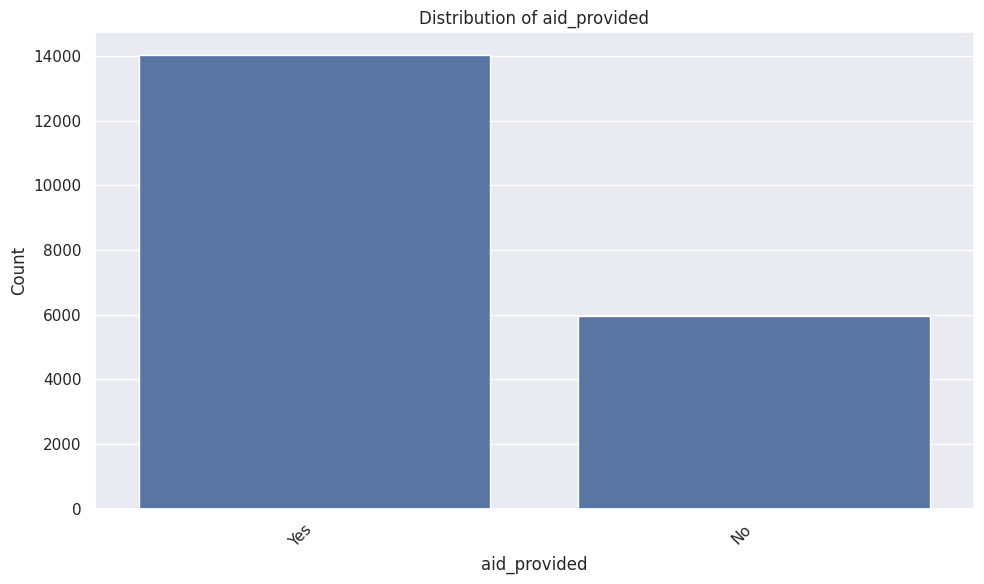

Value counts for disaster_type:
disaster_type
Earthquake           2910
Landslide            2891
Wildfire             2870
Hurricane            2866
Drought              2863
Volcanic Eruption    2827
Flood                2773
Name: count, dtype: int64

Value counts for location:
location
India          2583
Indonesia      2530
Turkey         2515
Chile          2515
Italy          2485
Japan          2477
Philippines    2453
USA            2442
Name: count, dtype: int64

Value counts for date:
date
2024-12-12    34
2024-05-15    34
2025-09-27    34
2024-07-09    33
2024-03-18    32
              ..
2025-03-07     8
2024-12-03     8
2025-11-15     7
2023-03-08     7
2024-11-02     6
Name: count, Length: 1096, dtype: int64

Value counts for aid_provided:
aid_provided
Yes    14030
No      5970
Name: count, dtype: int64



In [12]:
# Getting a list of numerical columns
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Iterate through numerical columns and create histograms
for col in numerical_cols:
    plt.figure(figsize=(10, 6))
    sns.histplot(data=df, x=col, kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

# Getting a list of categorical columns
categorical_cols = df.select_dtypes(include='object').columns.tolist()

# Iterating through categorical columns and create countplots
for col in categorical_cols:
    plt.figure(figsize=(10, 6))
    sns.countplot(data=df, x=col)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

# We can also use value_counts for a quick look at categorical data distribution
for col in categorical_cols:
    print(f"Value counts for {col}:\n{df[col].value_counts()}\n")

# Bivariate Analysis

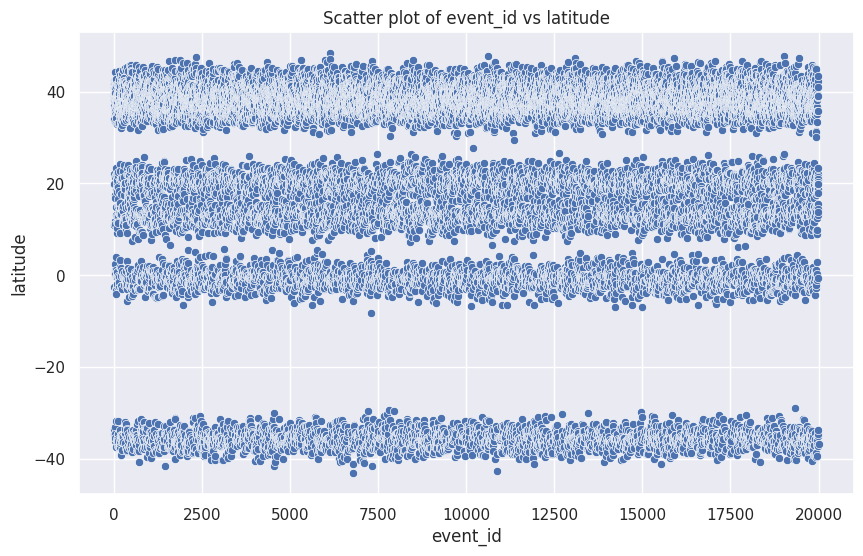

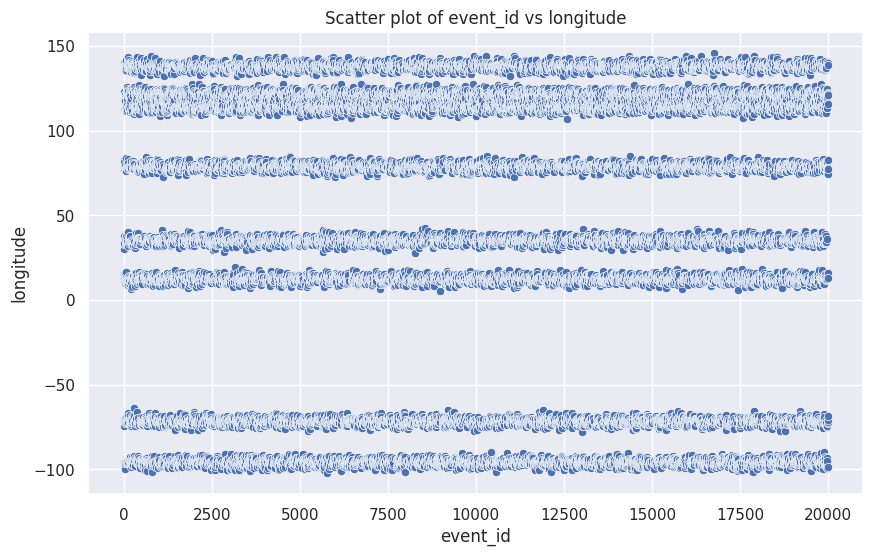

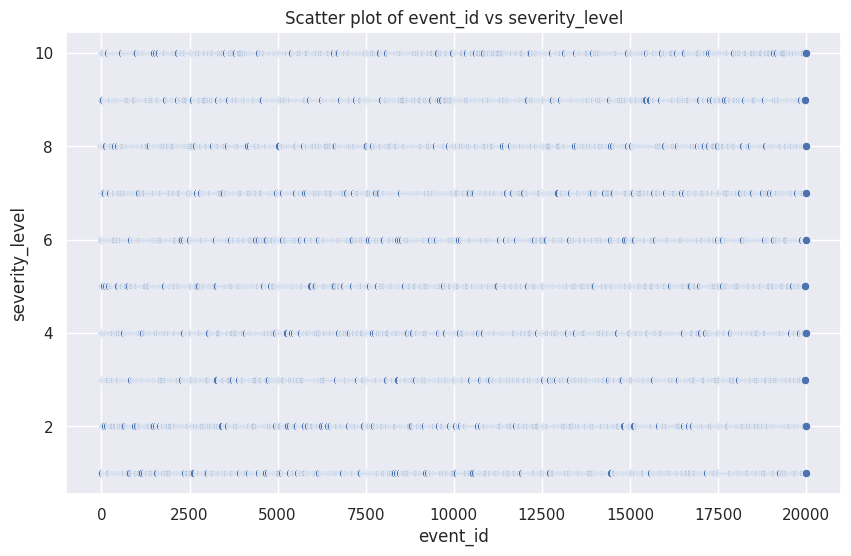

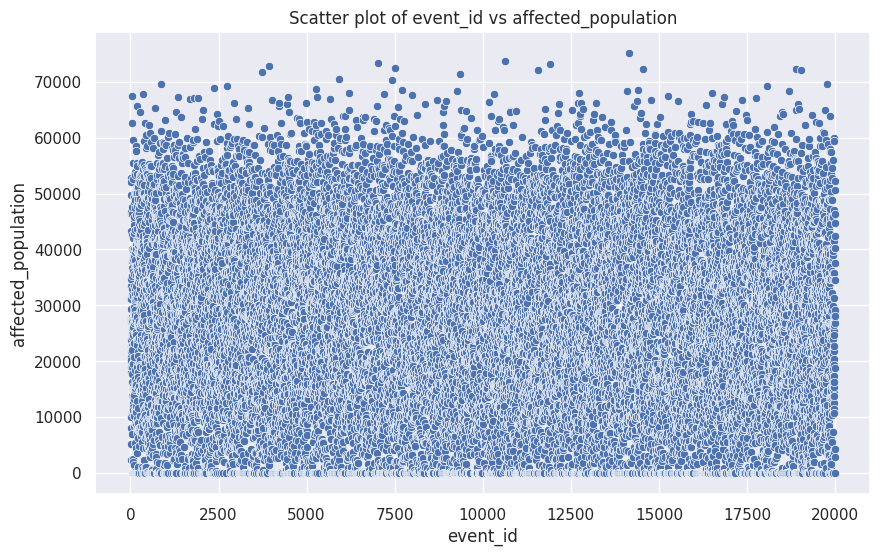

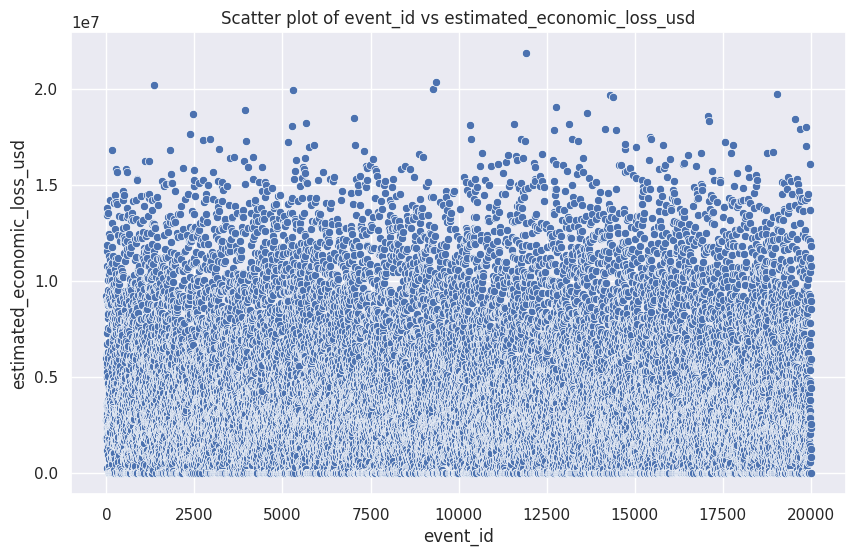

...

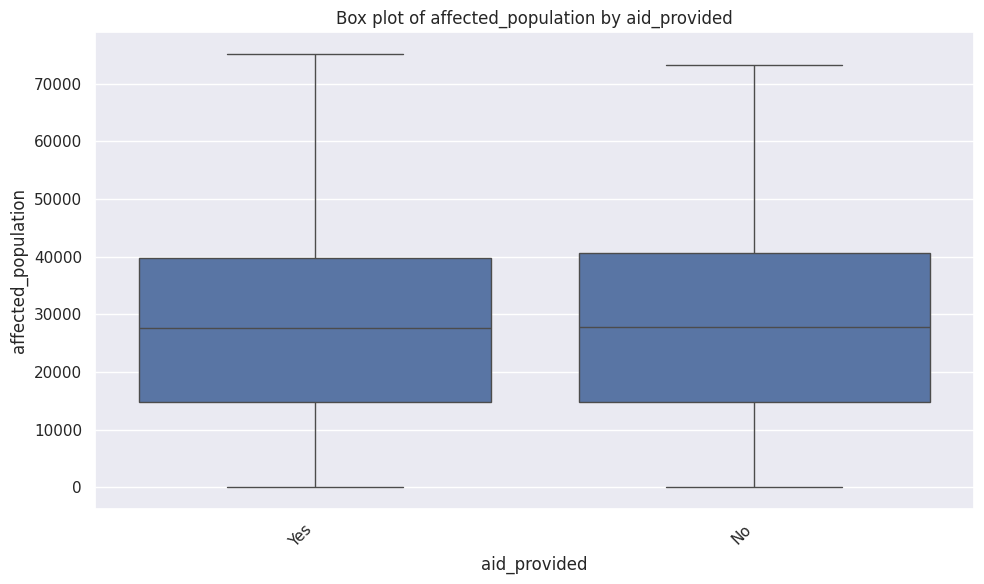

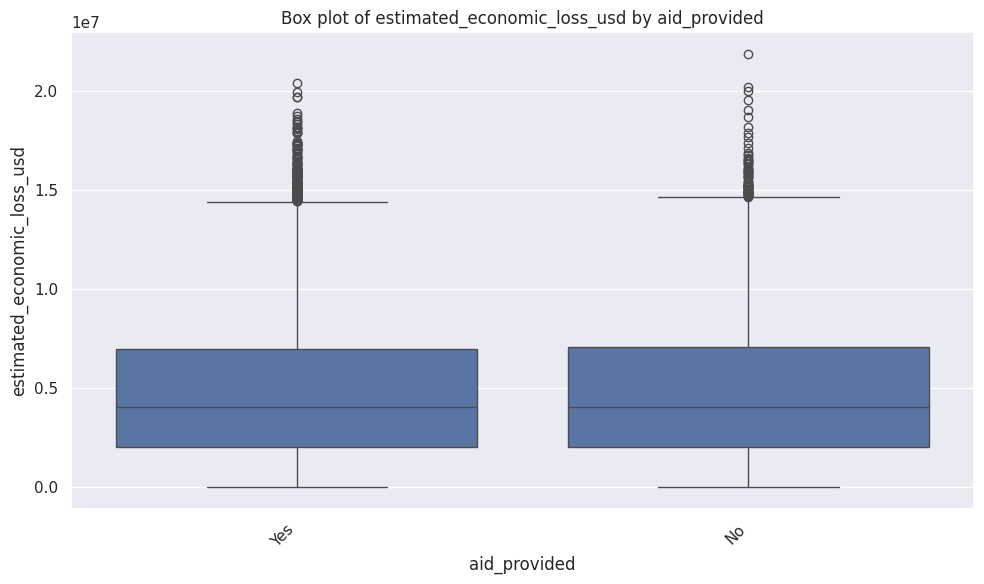

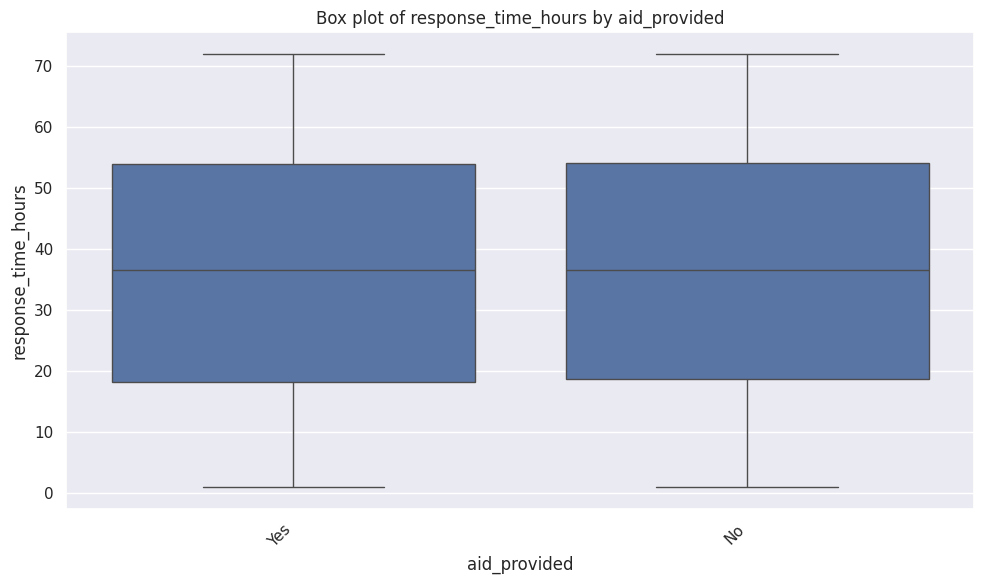

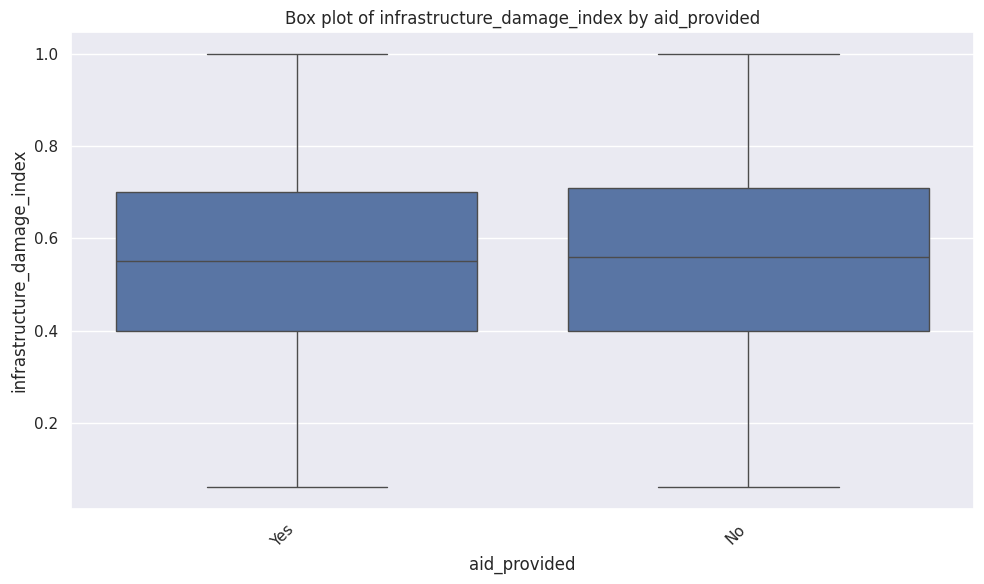

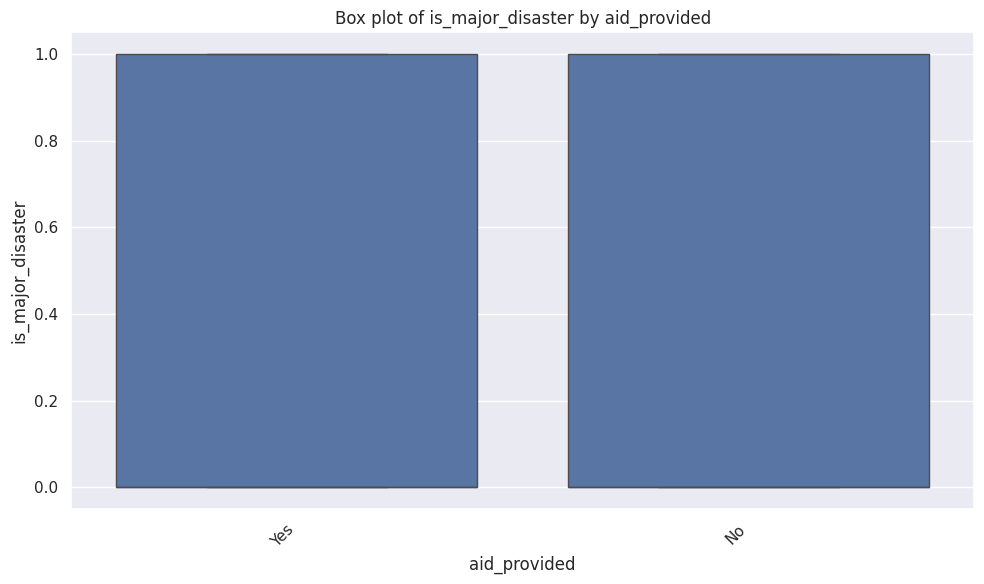

In [13]:
# Numerical-Numerical relationships (Scatter plots)
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Iterate through pairs of numerical columns and create scatter plots
for i in range(len(numerical_cols)):
    for j in range(i + 1, len(numerical_cols)):
        col1 = numerical_cols[i]
        col2 = numerical_cols[j]
        plt.figure(figsize=(10, 6))
        sns.scatterplot(data=df, x=col1, y=col2)
        plt.title(f'Scatter plot of {col1} vs {col2}')
        plt.xlabel(col1)
        plt.ylabel(col2)
        plt.show()

# Categorical-Numerical relationships (Box plots)
categorical_cols = df.select_dtypes(include='object').columns.tolist()
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Iterate through categorical and numerical columns and create box plots
for cat_col in categorical_cols:
    for num_col in numerical_cols:
        plt.figure(figsize=(10, 6))
        sns.boxplot(data=df, x=cat_col, y=num_col)
        plt.title(f'Box plot of {num_col} by {cat_col}')
        plt.xlabel(cat_col)
        plt.ylabel(num_col)
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.show()

## Analyze Temporal Trends


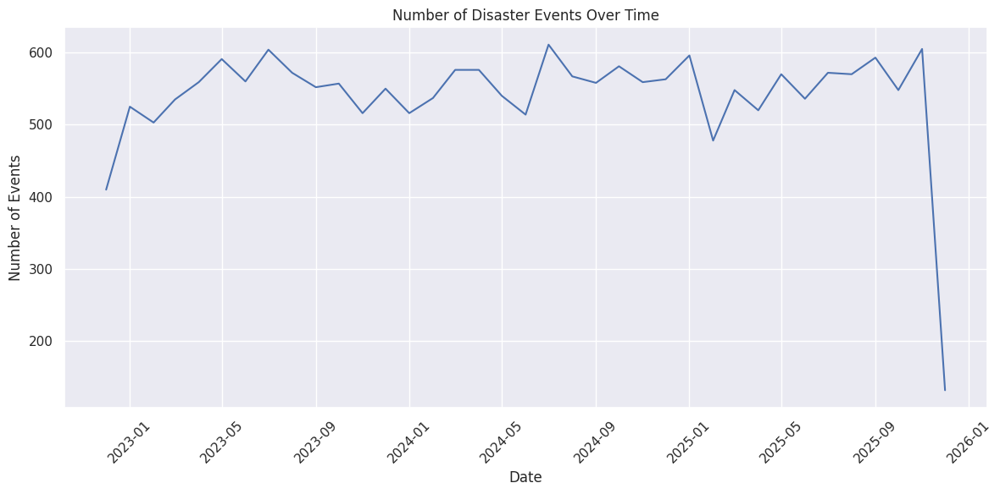

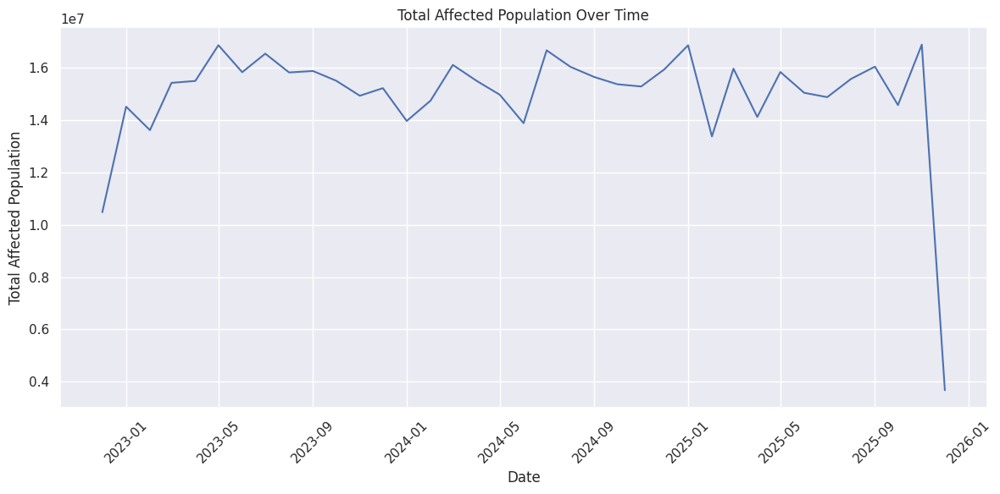

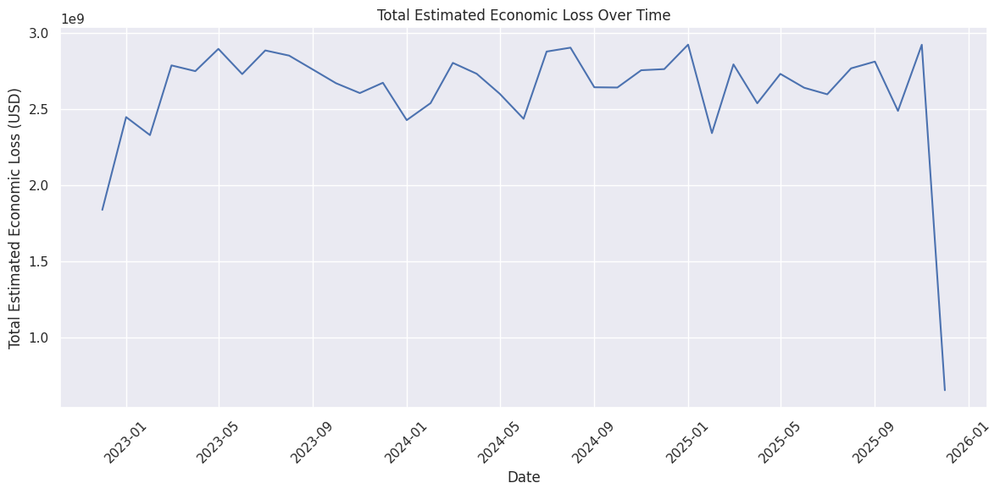

In [17]:
events_by_month_year = df.groupby(['year', 'month']).size().reset_index(name='event_count')
population_by_month_year = df.groupby(['year', 'month'])['affected_population'].sum().reset_index()
economic_loss_by_month_year = df.groupby(['year', 'month'])['estimated_economic_loss_usd'].sum().reset_index()

events_by_month_year['date_col'] = pd.to_datetime(events_by_month_year['year'].astype(str) + '-' + events_by_month_year['month'].astype(str))
population_by_month_year['date_col'] = pd.to_datetime(population_by_month_year['year'].astype(str) + '-' + population_by_month_year['month'].astype(str))
economic_loss_by_month_year['date_col'] = pd.to_datetime(economic_loss_by_month_year['year'].astype(str) + '-' + economic_loss_by_month_year['month'].astype(str))

plt.figure(figsize=(12, 6))
sns.lineplot(data=events_by_month_year, x='date_col', y='event_count')
plt.title('Number of Disaster Events Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Events')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 6))
sns.lineplot(data=population_by_month_year, x='date_col', y='affected_population')
plt.title('Total Affected Population Over Time')
plt.xlabel('Date')
plt.ylabel('Total Affected Population')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 6))
sns.lineplot(data=economic_loss_by_month_year, x='date_col', y='estimated_economic_loss_usd')
plt.title('Total Estimated Economic Loss Over Time')
plt.xlabel('Date')
plt.ylabel('Total Estimated Economic Loss (USD)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## Geographical Analysis


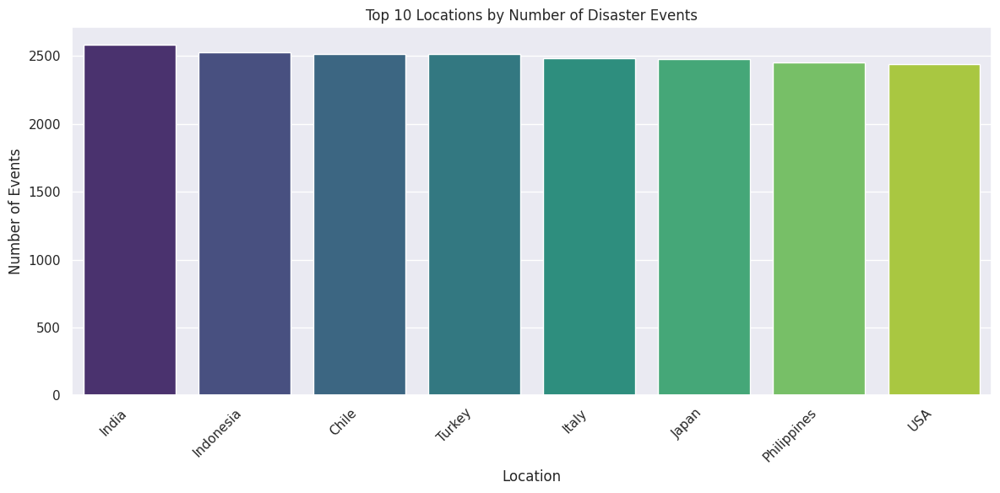

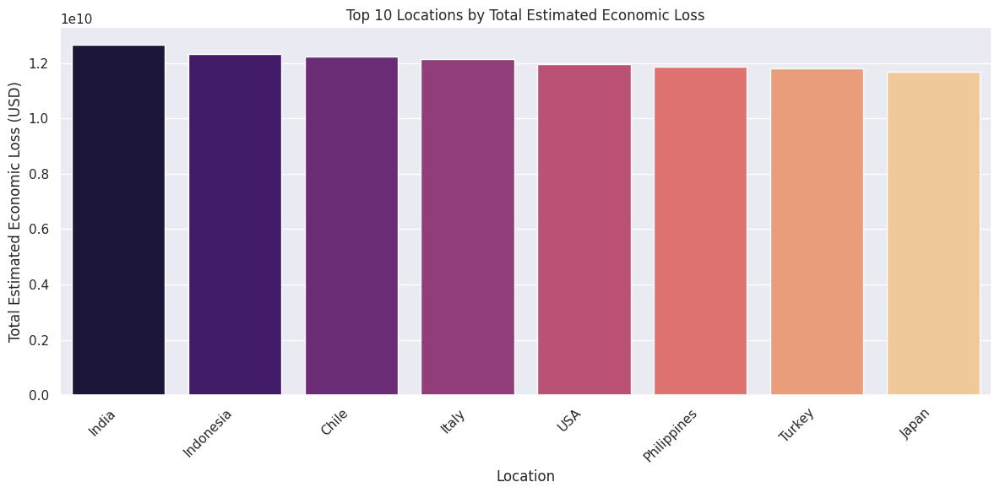

In [18]:
events_by_location = df.groupby('location').size().reset_index(name='event_count')
loss_by_location = df.groupby('location')['estimated_economic_loss_usd'].sum().reset_index()

top_10_events_locations = events_by_location.sort_values(by='event_count', ascending=False).head(10)
top_10_loss_locations = loss_by_location.sort_values(by='estimated_economic_loss_usd', ascending=False).head(10)

plt.figure(figsize=(12, 6))
sns.barplot(x='location', y='event_count', data=top_10_events_locations, palette='viridis')
plt.title('Top 10 Locations by Number of Disaster Events')
plt.xlabel('Location')
plt.ylabel('Number of Events')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 6))
sns.barplot(x='location', y='estimated_economic_loss_usd', data=top_10_loss_locations, palette='magma')
plt.title('Top 10 Locations by Total Estimated Economic Loss')
plt.xlabel('Location')
plt.ylabel('Total Estimated Economic Loss (USD)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

## Disaster Type Impact Analysis



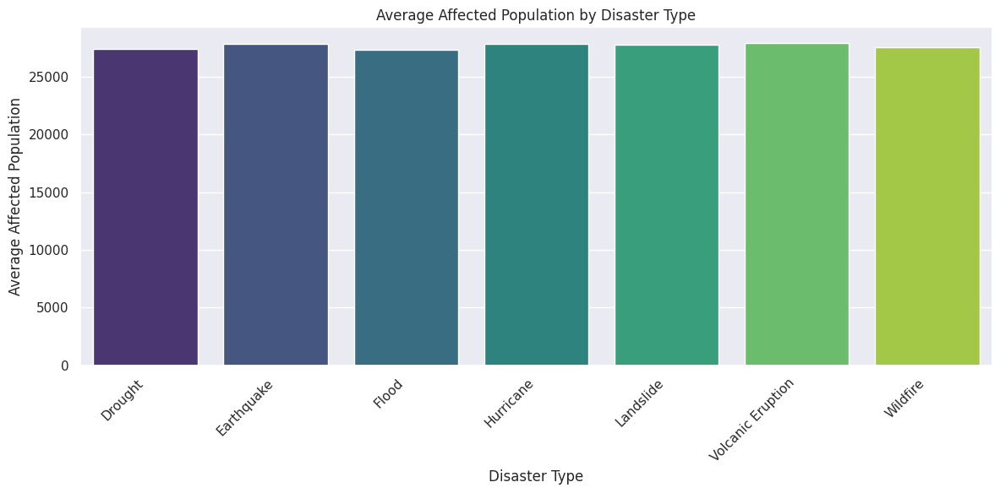

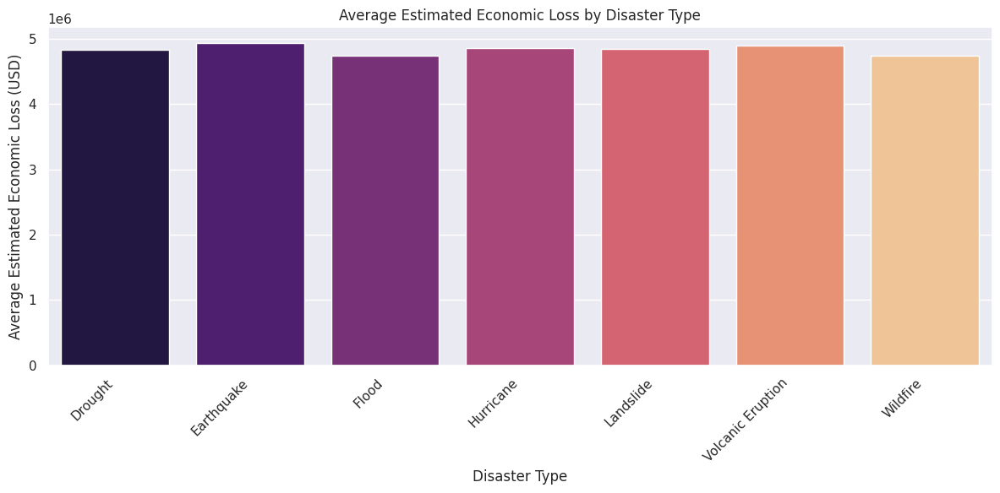

In [19]:
avg_population_by_disaster = df.groupby('disaster_type')['affected_population'].mean().reset_index()
avg_loss_by_disaster = df.groupby('disaster_type')['estimated_economic_loss_usd'].mean().reset_index()

plt.figure(figsize=(12, 6))
sns.barplot(x='disaster_type', y='affected_population', data=avg_population_by_disaster, palette='viridis')
plt.title('Average Affected Population by Disaster Type')
plt.xlabel('Disaster Type')
plt.ylabel('Average Affected Population')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 6))
sns.barplot(x='disaster_type', y='estimated_economic_loss_usd', data=avg_loss_by_disaster, palette='magma')
plt.title('Average Estimated Economic Loss by Disaster Type')
plt.xlabel('Disaster Type')
plt.ylabel('Average Estimated Economic Loss (USD)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

## Aid Effectiveness Analysis


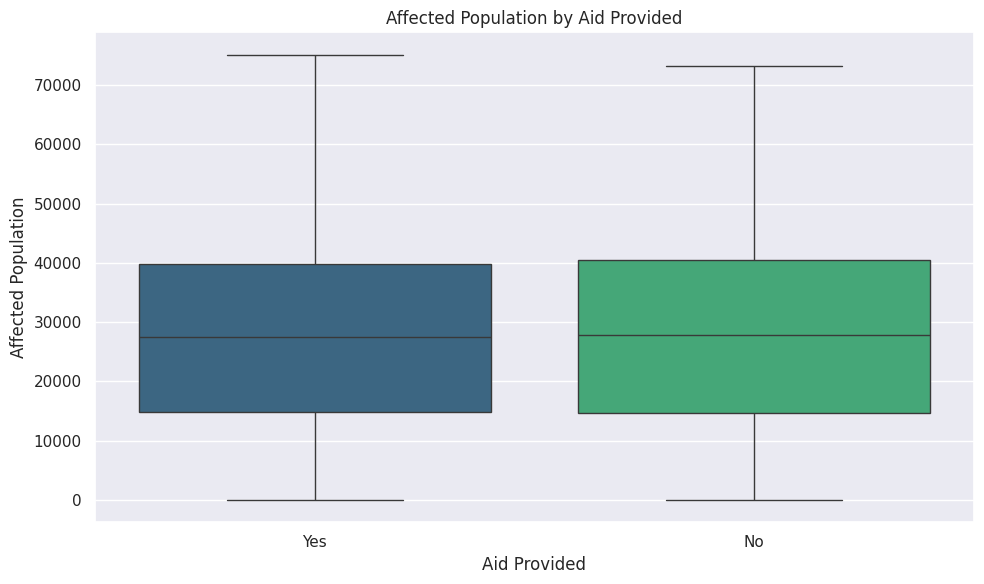

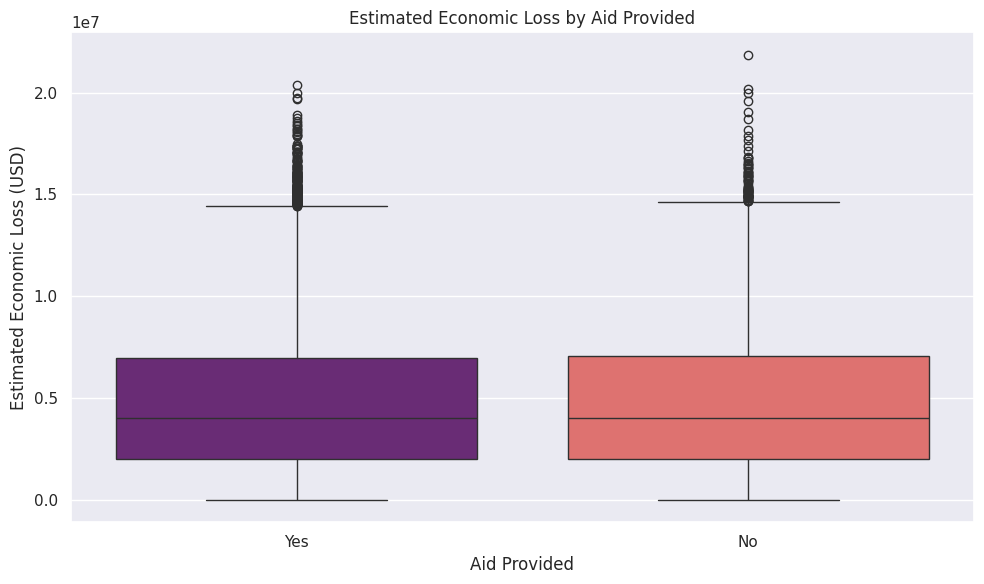

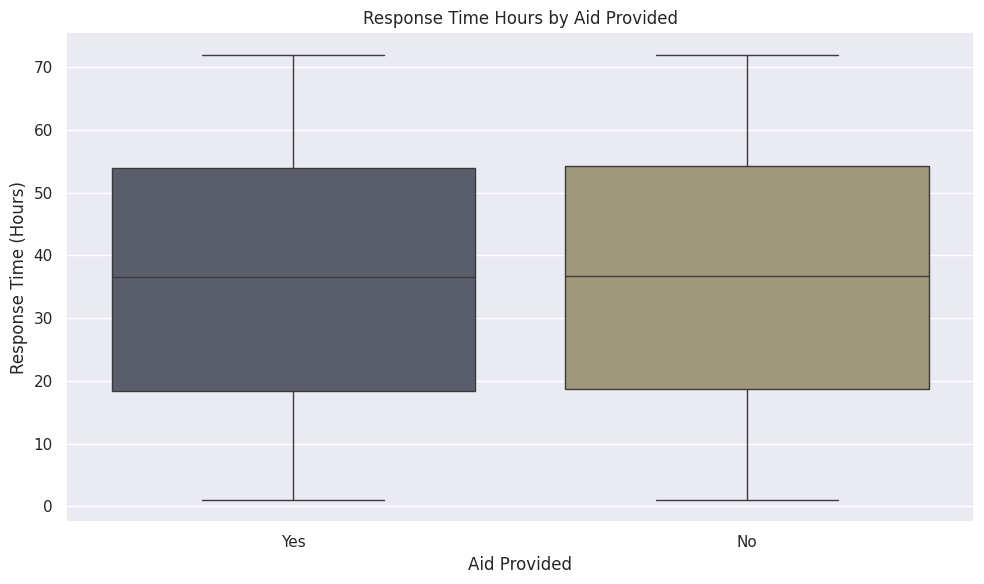

In [20]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='aid_provided', y='affected_population', palette='viridis')
plt.title('Affected Population by Aid Provided')
plt.xlabel('Aid Provided')
plt.ylabel('Affected Population')
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='aid_provided', y='estimated_economic_loss_usd', palette='magma')
plt.title('Estimated Economic Loss by Aid Provided')
plt.xlabel('Aid Provided')
plt.ylabel('Estimated Economic Loss (USD)')
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='aid_provided', y='response_time_hours', palette='cividis')
plt.title('Response Time Hours by Aid Provided')
plt.xlabel('Aid Provided')
plt.ylabel('Response Time (Hours)')
plt.tight_layout()
plt.show()

## Severity Level Analysis

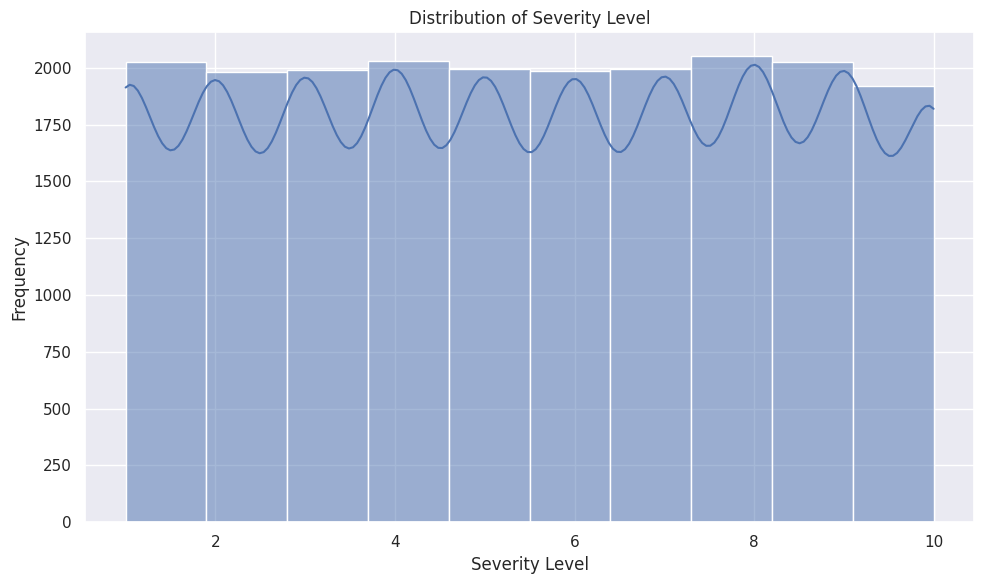

In [21]:
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='severity_level', kde=True, bins=10)
plt.title('Distribution of Severity Level')
plt.xlabel('Severity Level')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

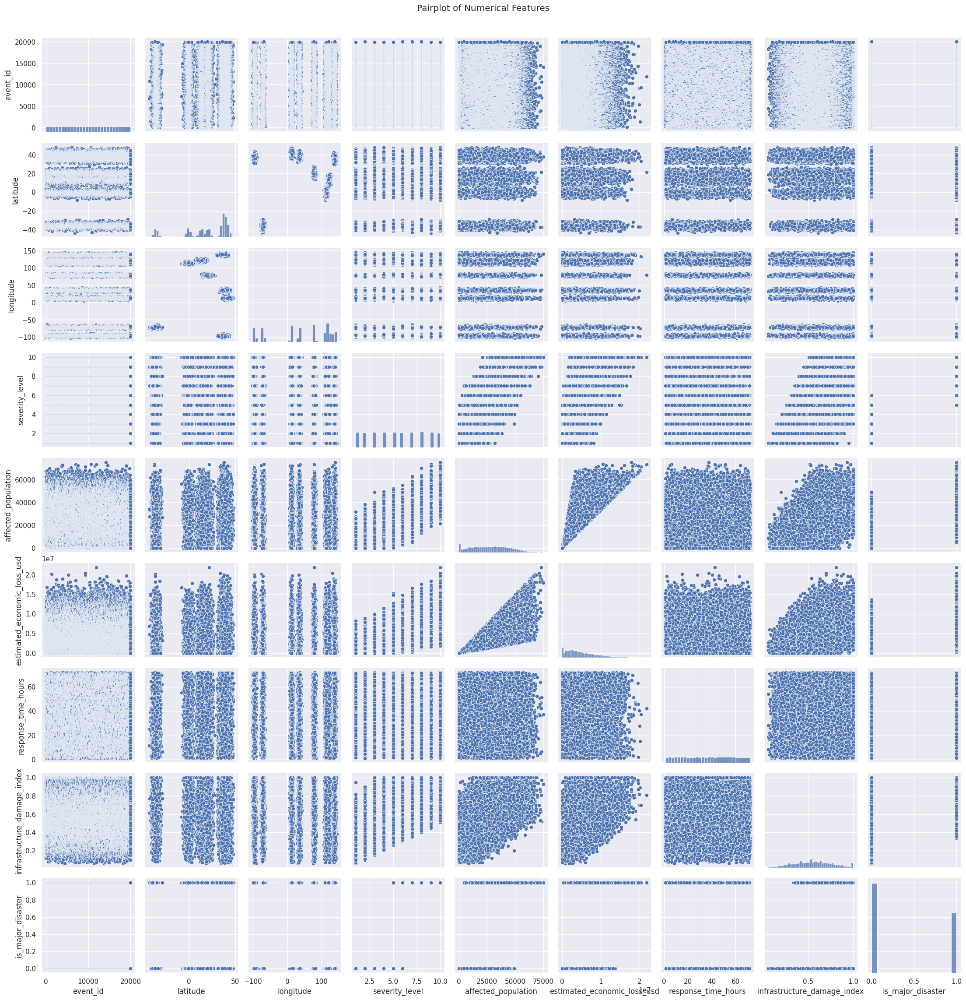

In [14]:
sns.pairplot(df.select_dtypes(include=np.number))
plt.suptitle('Pairplot of Numerical Features', y=1.02)
plt.show()

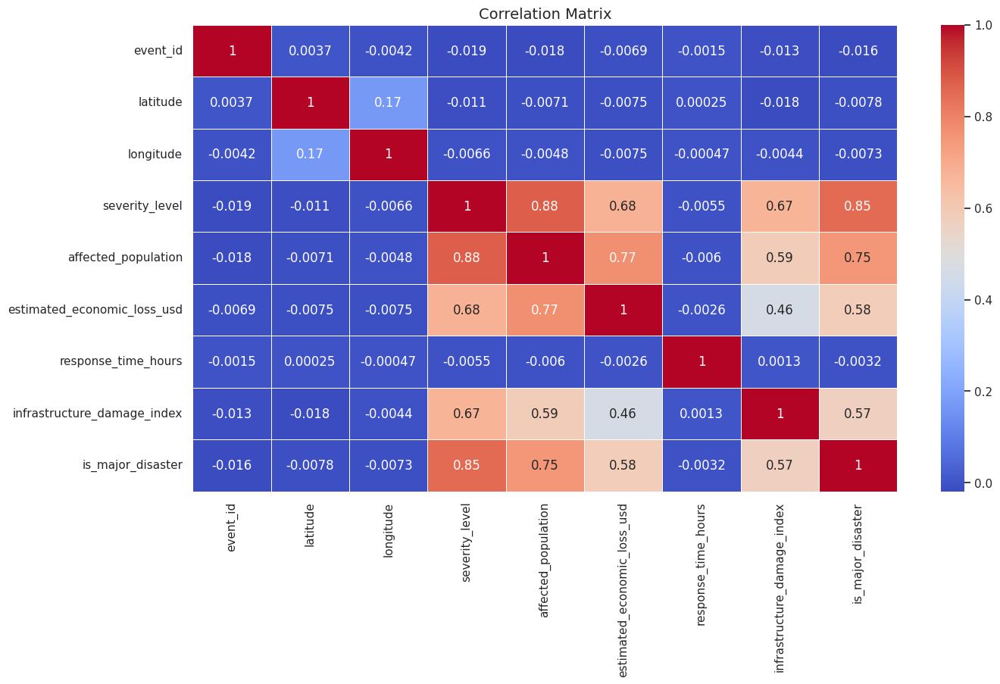

In [15]:
plt.figure(figsize=(15, 8))
sns.heatmap(df.corr(numeric_only = True), annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Matrix", fontsize=14)
plt.show()

# Thank You